In [1]:
%load_ext autoreload
%autoreload 2
import os, sys # add MaaSSim to path (not needed if MaaSSim is already in path)
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import MaaSSim

In [3]:
#!pip install MaaSSim
import MaaSSim.utils
import logging
from dotmap import DotMap
import MaaSSim.simulators
from MaaSSim.data_structures import structures as inData

In [4]:
import osmnx as ox
import networkx as nx
import random
import pandas as pd
import matplotlib.pyplot as plt          
import numpy as np
import seaborn as sns

In [5]:
params = MaaSSim.utils.get_config('glance.json')
params.city = "Delft, Netherlands"
params.paths.G = "../../data/graphs/Delft.graphml"
params.paths.skim = "../../data/graphs/Delft.csv"
sim= MaaSSim.simulators.simulate(params=params)

12-05-22 12:45:34-WARNING-Setting up 4h simulation at 2022-05-12 11:42:46 for 2 vehicles and 5 passengers in Delft, Netherlands
12-05-22 12:45:34-INFO--------------------	Starting simulation	-------------------
12-05-22 12:45:34-INFO-pax    0  got to dest at                           2022-05-12 11:50:22
12-05-22 12:45:34-INFO-pax    1  got to dest at                           2022-05-12 13:12:51
12-05-22 12:45:34-INFO-pax    2  got to dest at                           2022-05-12 14:00:11
12-05-22 12:45:34-INFO-pax    3  got to dest at                           2022-05-12 14:06:10
12-05-22 12:45:34-INFO-pax    4  got to dest at                           2022-05-12 14:15:46
12-05-22 12:45:34-INFO-veh    2  quitted shift                            2022-05-12 17:42:45
12-05-22 12:45:34-INFO-veh    1  quitted shift                            2022-05-12 17:42:45
12-05-22 12:45:34-INFO--------------------	Simulation over		-------------------
12-05-22 12:45:34-INFO-queue of requests 0
12-05-22

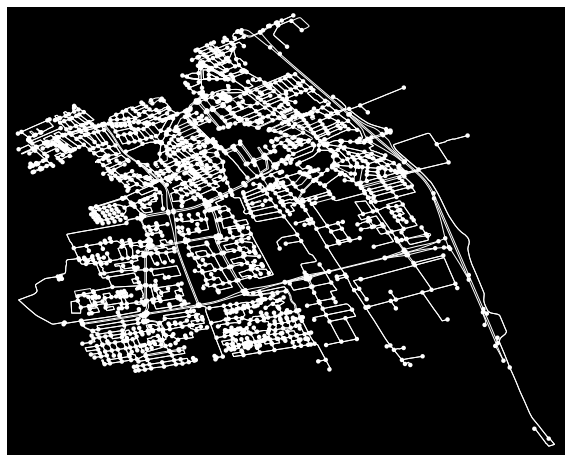

In [6]:
G = sim.inData.G
fig, ax = ox.plot_graph(G, figsize=(10, 10), show=False, close=False, node_size=20, bgcolor='black', edge_color='w')

In [7]:
ox.folium.plot_graph_folium(G)

In [8]:
center_x = pd.DataFrame((G.nodes(data='x')))[1].mean()
center_y = pd.DataFrame((G.nodes(data='y')))[1].mean()
nearest = ox.distance.get_nearest_node(G, (center_y, center_x))
central_radius = 1000 #f#
central_nodes =list(sim.inData.skim[nearest][sim.inData.skim[nearest]<central_radius].keys()) #f#

In [9]:
c = nearest
g = nx.ego_graph(G, c, radius=10, center=True)

In [10]:
gdf = ox.geocode_to_gdf('Delft, Netherlands')

<AxesSubplot:>

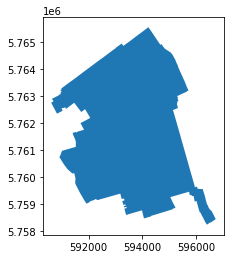

In [11]:
ox.project_gdf(gdf).plot()

In [12]:
ox.folium.plot_graph_folium(G)

In [13]:
import geopandas as gpd
from shapely.geometry import Polygon

lat_point_list = [50.854457, 52.518172, 50.072651, 48.853033, 50.854457]
lon_point_list = [4.377184, 13.407759, 14.435935, 2.349553, 4.377184]
polygon_geom = Polygon(zip(lon_point_list, lat_point_list))
crs = {'init': 'epsg:4326'}
polygon = gpd.GeoDataFrame(index=[0], crs=crs, geometry=[polygon_geom])

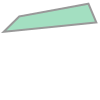

In [14]:
polygon_geom

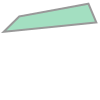

In [15]:
polygon.geometry[0]

In [ ]:
==================================================================================

In [16]:
cities = ox.geocode_to_gdf(['Delft, Netherlands', 'Delfgauw, Netherlands'])
whole_polygon = cities.unary_union #unary union of both geometries
pol1 = cities['geometry'].iloc[0]
pol2 = cities['geometry'].iloc[1]

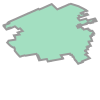

In [17]:
whole_polygon

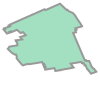

In [18]:
pol1

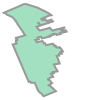

In [19]:
pol2

In [20]:
G = ox.graph_from_polygon(whole_polygon, network_type='drive', simplify=True)
print(len(G))

2615


In [21]:
nodes = ox.graph_to_gdfs(G, edges=False)
nodes_in_pol1 = nodes[nodes.within(pol1)]
print(len(nodes_in_pol1))

2368


In [22]:
g1 = ox.graph_from_place('Delft, Netherlands', network_type='drive')
len(g1)

2368

In [ ]:
==========================================================================================

In [ ]:
How to get the geodata inside the each polygon from the main graph

In [23]:
import geopandas as gpd
df = gpd.read_file('https://maps.amsterdam.nl/open_geodata/geojson_latlng.php?KAARTLAAG=PC4_BUURTEN_EXWATER&THEMA=postcode')
df

,Postcode4,Opp_m2,geometry
0,1082,1469377,"POLYGON ((52.33810 4.86869, 52.33827 4.87200, ..."
1,1102,3139699,"POLYGON ((52.32404 4.95676, 52.31659 4.96357, ..."
2,1101,5292105,"POLYGON ((52.31933 4.94021, 52.31916 4.94035, ..."
3,1107,2029641,"POLYGON ((52.29537 4.96175, 52.29557 4.96232, ..."
4,1103,2041467,"POLYGON ((52.32443 4.99167, 52.32123 4.98231, ..."
...,...,...,...
75,1044,2021347,"POLYGON ((52.41780 4.80390, 52.41782 4.80397, ..."
76,1057,999544,"POLYGON ((52.36958 4.84257, 52.36961 4.84522, ..."
77,1022,1286869,"MULTIPOLYGON (((52.38435 4.94398, 52.38439 4.9..."
78,1052,530690,"POLYGON ((52.37158 4.86636, 52.37253 4.86724, ..."


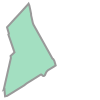

In [24]:
# choose one of the polygons
p69 = df.geometry[69]
p69

In [25]:
list(p69.exterior.coords.xy[0])

[52.384172,
 52.383916,
 52.383885,
 52.383694,
 52.383512,
 52.379723,
 52.379592,
 52.379263,
 52.379258,
 52.378937,
 52.378894,
 52.378758,
 52.378688,
 52.377024,
 52.376184,
 52.374813,
 52.374454,
 52.374832,
 52.374723,
 52.375945,
 52.375167,
 52.375234,
 52.373813,
 52.373795,
 52.373896,
 52.373953,
 52.373945,
 52.374069,
 52.37449,
 52.377865,
 52.378392,
 52.381212,
 52.381275,
 52.381333,
 52.38158,
 52.381655,
 52.381732,
 52.381802,
 52.381857,
 52.381924,
 52.381992,
 52.382061,
 52.382177,
 52.382298,
 52.382404,
 52.382558,
 52.382701,
 52.384172]

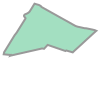

In [26]:
# The polygon created above is making error because the lats and lons are switched. So, we solve the problem here. we should do this to all polygons in the dataframe.
lats = list(p69.exterior.coords.xy[0])
lons = list(p69.exterior.coords.xy[1])
p69 = Polygon(zip(lons, lats))
p69

In [27]:
crs = {'init': 'epsg:4326'}
pn = gpd.GeoDataFrame(index=[0], crs=crs, geometry=[polygon])

GeometryTypeError: Unknown geometry type: featurecollection

In [28]:
g = ox.graph_from_polygon(p69, network_type='drive', simplify=True)
ox.folium.plot_graph_folium(g)

In [29]:
G = ox.graph_from_place('Amsterdam, Netherlands', network_type='drive')

In [30]:
nodes = ox.graph_to_gdfs(G, edges=False)
nodes_in_pol = nodes[nodes.within(p69)]
print(len(nodes_in_pol))

145


In [31]:
import folium
m = folium.Map([52.384172, 4.881666], zoom_start=15, tiles='cartodbpositron')
folium.GeoJson(p69).add_to(m)
#folium.LatLngPopup().add_to(m)
m

In [ ]:
================================================================================================

In [ ]:
How to create Amsterdam_zones.csv

In [86]:
import geopandas as gpd
df = gpd.read_file('https://maps.amsterdam.nl/open_geodata/geojson_latlng.php?KAARTLAAG=PC4_BUURTEN_EXWATER&THEMA=postcode')
df

,Postcode4,Opp_m2,geometry
0,1082,1469377,"POLYGON ((52.33810 4.86869, 52.33827 4.87200, ..."
1,1102,3139699,"POLYGON ((52.32404 4.95676, 52.31659 4.96357, ..."
2,1101,5292105,"POLYGON ((52.31933 4.94021, 52.31916 4.94035, ..."
3,1107,2029641,"POLYGON ((52.29537 4.96175, 52.29557 4.96232, ..."
4,1103,2041467,"POLYGON ((52.32443 4.99167, 52.32123 4.98231, ..."
...,...,...,...
75,1044,2021347,"POLYGON ((52.41780 4.80390, 52.41782 4.80397, ..."
76,1057,999544,"POLYGON ((52.36958 4.84257, 52.36961 4.84522, ..."
77,1022,1286869,"MULTIPOLYGON (((52.38435 4.94398, 52.38439 4.9..."
78,1052,530690,"POLYGON ((52.37158 4.86636, 52.37253 4.86724, ..."


In [87]:
import shapely
from shapely.geometry import Polygon

# 7,53,54,70,72,
for i in range(0,len(df)):
    geo = df.geometry[i]
    if geo.geom_type == 'Polygon':
        lats, lons = geo.exterior.xy
        geo = Polygon(zip(lons, lats))
        df.at[i,'geometry'] = geo

    elif geo.geom_type == 'MultiPolygon':
        try:
            allparts = [p.buffer(0) for p in geo]
            geo = shapely.ops.cascaded_union(allparts)
            lats, lons = geo.exterior.xy
            geo = Polygon(zip(lons, lats))
            df.at[i,'geometry'] = geo 
        except:
            ps = []
            for p in geo:
                lats, lons = p.exterior.xy
                p = Polygon(zip(lons, lats))
                ps.append(p)
            geo = shapely.ops.unary_union(ps)
            df.at[i,'geometry'] = geo

In [88]:
pop_list = [6606, 7067, 26792, 15056, 5926, 5568, 9336, 14004, 13174, 6539, 4738, 6128, 7461, 13033, 2946, 6082, 2434, 9049, 8332, 19151, 11152, 13196, 1765, 2234, 17548,
    13282, 16208, 16275, 20241, 15789, 28120, 6151, 4176, 4582, 6186, 8424, 6817, 6466, 7080, 4699, 6496, 7450, 9257, 9431, 12497, 9464, 27614, 24811, 11594, 15531,
    9773, 4281, 4214, 2445, 6139, 8440, 11582, 7797, 9471, 13677, 8852, 8869, 878, 6204, 6905, 3710, 3927, 3289, 11070, 12764, 15472, 14066, 14750, 13813, 9294, 10044,
    12102, 7301, 5045, 2766]
total_pop = sum(pop_list)

In [89]:
df.sort_values("Postcode4", inplace=True)
df.reset_index(drop=True, inplace=True)
df['population'] = pop_list
df['pop_share'] = df['population']/total_pop
df.to_csv('Amsterdam_zones.csv')
df

,Postcode4,Opp_m2,geometry,population,pop_share
0,1011,814604,"MULTIPOLYGON (((4.89571 52.36773, 4.89579 52.3...",6606,0.008438
1,1012,1002568,"POLYGON ((4.88930 52.37445, 4.88967 52.37481, ...",7067,0.009027
2,1013,2919420,"POLYGON ((4.86152 52.41167, 4.86224 52.41141, ...",26792,0.034222
3,1014,2488088,"POLYGON ((4.84432 52.39530, 4.84441 52.39558, ...",15056,0.019231
4,1015,736046,"POLYGON ((4.88167 52.38417, 4.88254 52.38392, ...",5926,0.007569
...,...,...,...,...,...
75,1104,2034608,"POLYGON ((4.96357 52.31659, 4.96441 52.31688, ...",10044,0.012829
76,1106,2604402,"POLYGON ((4.97142 52.30799, 4.97627 52.30268, ...",12102,0.015458
77,1107,2029641,"POLYGON ((4.96175 52.29537, 4.96232 52.29557, ...",7301,0.009326
78,1108,2258028,"MULTIPOLYGON (((4.99690 52.31764, 4.99702 52.3...",5045,0.006444


In [ ]:
=========================================================================

In [91]:
df

,Postcode4,Opp_m2,geometry,population,pop_share
0,1011,814604,"MULTIPOLYGON (((4.89571 52.36773, 4.89579 52.3...",6606,0.008438
1,1012,1002568,"POLYGON ((4.88930 52.37445, 4.88967 52.37481, ...",7067,0.009027
2,1013,2919420,"POLYGON ((4.86152 52.41167, 4.86224 52.41141, ...",26792,0.034222
3,1014,2488088,"POLYGON ((4.84432 52.39530, 4.84441 52.39558, ...",15056,0.019231
4,1015,736046,"POLYGON ((4.88167 52.38417, 4.88254 52.38392, ...",5926,0.007569
...,...,...,...,...,...
75,1104,2034608,"POLYGON ((4.96357 52.31659, 4.96441 52.31688, ...",10044,0.012829
76,1106,2604402,"POLYGON ((4.97142 52.30799, 4.97627 52.30268, ...",12102,0.015458
77,1107,2029641,"POLYGON ((4.96175 52.29537, 4.96232 52.29557, ...",7301,0.009326
78,1108,2258028,"MULTIPOLYGON (((4.99690 52.31764, 4.99702 52.3...",5045,0.006444


In [75]:
pl = []
for i in range(0,len(df)):
    pl.append(df.geometry[i])

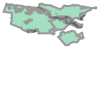

In [76]:
geo = shapely.ops.unary_union(pl)
geo

In [77]:
import folium
m = folium.Map([52.384172, 4.881666], zoom_start=11, tiles='cartodbpositron')
folium.GeoJson(geo).add_to(m)
m

In [ ]:
=======================================================================

In [23]:
df = pd.read_csv('Amsterdam_requests_new.csv')
df.drop('Unnamed: 0',inplace=True, axis=1)
df

,origin,destination,treq,tarr,ttrav,dist,orig_geo,dest_geo,origin_y,origin_x,destination_y,destination_x,haver_dist
0,46343829,5777055555,1900-01-01 19:36:00,1900-01-01 20:00:00,0 days 00:24:00.000000000,2696,POINT (4.8889728 52.3618803),POINT (4.8947789 52.3796757),52.361880,4.888973,52.379676,4.894779,2017.639692
1,1525015196,2020569141,1900-01-01 18:29:00,1900-01-01 18:53:00,0 days 00:24:00.000000000,3489,POINT (4.9062867 52.3591398),POINT (4.8847412 52.3739514),52.359140,4.906287,52.373951,4.884741,2202.841087
2,46484989,6219354473,1900-01-01 13:24:00,1900-01-01 13:48:00,0 days 00:24:00.000000000,5152,POINT (4.8663224 52.3934468),POINT (4.8811843 52.4257211),52.393447,4.866322,52.425721,4.881184,3727.642905
3,413562329,7890114045,1900-01-01 17:56:00,1900-01-01 18:11:00,0 days 00:15:00.000000000,11688,POINT (4.7589916 52.3838134),POINT (4.7312846 52.4078082),52.383813,4.758992,52.407808,4.731285,3263.899637
4,46445391,1732413559,1900-01-01 14:59:00,1900-01-01 15:28:00,0 days 00:29:00.000000000,4787,POINT (4.8225358 52.3841401),POINT (4.7929588 52.3574315),52.384140,4.822536,52.357431,4.792959,3584.982166
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100316,2101786750,520376452,1900-01-01 13:20:00,1900-01-01 16:01:00,0 days 02:41:00.000000000,3198,POINT (4.8395385 52.345118),POINT (4.8273257 52.3651666),52.345118,4.839538,52.365167,4.827326,2378.601141
100317,30154649,46282361,1900-01-01 19:36:00,1900-01-01 20:00:00,0 days 00:24:00.000000000,5797,POINT (4.9420068 52.3601681),POINT (4.869708 52.3477848),52.360168,4.942007,52.347785,4.869708,5099.651861
100318,46419807,46330781,1900-01-01 23:02:00,1900-01-01 23:25:00,0 days 00:23:00.000000000,3290,POINT (4.8942334 52.3786703),POINT (4.8928959 52.358953),52.378670,4.894233,52.358953,4.892896,2194.346460
100319,46244835,46519996,1900-01-01 10:06:00,1900-01-01 10:32:00,0 days 00:26:00.000000000,9877,POINT (4.9388043 52.3393751),POINT (4.9167433 52.4049547),52.339375,4.938804,52.404955,4.916743,7444.338424


In [24]:
_inData = sim.inData
for i in range(0,len(df)):
    if df.loc[i].origin not in _inData.G.nodes or df.loc[i].destination not in _inData.G.nodes:
        df.drop(i, inplace=True)
df

,origin,destination,treq,tarr,ttrav,dist,orig_geo,dest_geo,origin_y,origin_x,destination_y,destination_x,haver_dist
0,46343829,5777055555,1900-01-01 19:36:00,1900-01-01 20:00:00,0 days 00:24:00.000000000,2696,POINT (4.8889728 52.3618803),POINT (4.8947789 52.3796757),52.361880,4.888973,52.379676,4.894779,2017.639692
1,1525015196,2020569141,1900-01-01 18:29:00,1900-01-01 18:53:00,0 days 00:24:00.000000000,3489,POINT (4.9062867 52.3591398),POINT (4.8847412 52.3739514),52.359140,4.906287,52.373951,4.884741,2202.841087
2,46484989,6219354473,1900-01-01 13:24:00,1900-01-01 13:48:00,0 days 00:24:00.000000000,5152,POINT (4.8663224 52.3934468),POINT (4.8811843 52.4257211),52.393447,4.866322,52.425721,4.881184,3727.642905
4,46445391,1732413559,1900-01-01 14:59:00,1900-01-01 15:28:00,0 days 00:29:00.000000000,4787,POINT (4.8225358 52.3841401),POINT (4.7929588 52.3574315),52.384140,4.822536,52.357431,4.792959,3584.982166
5,442534817,46453553,1900-01-01 11:30:00,1900-01-01 12:16:00,0 days 00:46:00.000000000,2440,POINT (4.8042997 52.3903223),POINT (4.8330381 52.3859123),52.390322,4.804300,52.385912,4.833038,2010.989249
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100316,2101786750,520376452,1900-01-01 13:20:00,1900-01-01 16:01:00,0 days 02:41:00.000000000,3198,POINT (4.8395385 52.345118),POINT (4.8273257 52.3651666),52.345118,4.839538,52.365167,4.827326,2378.601141
100317,30154649,46282361,1900-01-01 19:36:00,1900-01-01 20:00:00,0 days 00:24:00.000000000,5797,POINT (4.9420068 52.3601681),POINT (4.869708 52.3477848),52.360168,4.942007,52.347785,4.869708,5099.651861
100318,46419807,46330781,1900-01-01 23:02:00,1900-01-01 23:25:00,0 days 00:23:00.000000000,3290,POINT (4.8942334 52.3786703),POINT (4.8928959 52.358953),52.378670,4.894233,52.358953,4.892896,2194.346460
100319,46244835,46519996,1900-01-01 10:06:00,1900-01-01 10:32:00,0 days 00:26:00.000000000,9877,POINT (4.9388043 52.3393751),POINT (4.9167433 52.4049547),52.339375,4.938804,52.404955,4.916743,7444.338424


In [25]:
df.to_csv('Amsterdam_requests_new.csv')
print('The previous file replaced by the new one.')

The previous file replaced by the new one


In [26]:
df = pd.read_csv('Amsterdam_requests_new.csv')
df

,Unnamed: 0,origin,destination,treq,tarr,ttrav,dist,orig_geo,dest_geo,origin_y,origin_x,destination_y,destination_x,haver_dist
0,0,46343829,5777055555,1900-01-01 19:36:00,1900-01-01 20:00:00,0 days 00:24:00.000000000,2696,POINT (4.8889728 52.3618803),POINT (4.8947789 52.3796757),52.361880,4.888973,52.379676,4.894779,2017.639692
1,1,1525015196,2020569141,1900-01-01 18:29:00,1900-01-01 18:53:00,0 days 00:24:00.000000000,3489,POINT (4.9062867 52.3591398),POINT (4.8847412 52.3739514),52.359140,4.906287,52.373951,4.884741,2202.841087
2,2,46484989,6219354473,1900-01-01 13:24:00,1900-01-01 13:48:00,0 days 00:24:00.000000000,5152,POINT (4.8663224 52.3934468),POINT (4.8811843 52.4257211),52.393447,4.866322,52.425721,4.881184,3727.642905
3,4,46445391,1732413559,1900-01-01 14:59:00,1900-01-01 15:28:00,0 days 00:29:00.000000000,4787,POINT (4.8225358 52.3841401),POINT (4.7929588 52.3574315),52.384140,4.822536,52.357431,4.792959,3584.982166
4,5,442534817,46453553,1900-01-01 11:30:00,1900-01-01 12:16:00,0 days 00:46:00.000000000,2440,POINT (4.8042997 52.3903223),POINT (4.8330381 52.3859123),52.390322,4.804300,52.385912,4.833038,2010.989249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93291,100316,2101786750,520376452,1900-01-01 13:20:00,1900-01-01 16:01:00,0 days 02:41:00.000000000,3198,POINT (4.8395385 52.345118),POINT (4.8273257 52.3651666),52.345118,4.839538,52.365167,4.827326,2378.601141
93292,100317,30154649,46282361,1900-01-01 19:36:00,1900-01-01 20:00:00,0 days 00:24:00.000000000,5797,POINT (4.9420068 52.3601681),POINT (4.869708 52.3477848),52.360168,4.942007,52.347785,4.869708,5099.651861
93293,100318,46419807,46330781,1900-01-01 23:02:00,1900-01-01 23:25:00,0 days 00:23:00.000000000,3290,POINT (4.8942334 52.3786703),POINT (4.8928959 52.358953),52.378670,4.894233,52.358953,4.892896,2194.346460
93294,100319,46244835,46519996,1900-01-01 10:06:00,1900-01-01 10:32:00,0 days 00:26:00.000000000,9877,POINT (4.9388043 52.3393751),POINT (4.9167433 52.4049547),52.339375,4.938804,52.404955,4.916743,7444.338424


<AxesSubplot:xlabel='dist'>

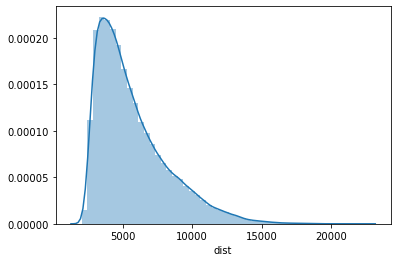

In [41]:
sns.distplot(df['dist'])